# What makes a country of people happy? 
# What should a government focus on to make their citizens happy?

## Importing basic libraries and understanding data

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
from scipy.interpolate import interp1d
from io import StringIO
from scipy.optimize import curve_fit
import plotly.plotly as py
import plotly.graph_objs as go

sb.set() # set the default Seaborn style for graphics

In [2]:
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

In [3]:
happydata = pd.read_excel('WHR2018Chapter2OnlineData.xls')
happydata.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540


In [4]:
print("Data type : ", type(happydata))
print("Data dims : ", happydata.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (1562, 19)


In [5]:
print(happydata.dtypes)

country                                                      object
year                                                          int64
Life Ladder                                                 float64
Log GDP per capita                                          float64
Social support                                              float64
Healthy life expectancy at birth                            float64
Freedom to make life choices                                float64
Generosity                                                  float64
Perceptions of corruption                                   float64
Positive affect                                             float64
Negative affect                                             float64
Confidence in national government                           float64
Democratic Quality                                          float64
Delivery Quality                                            float64
Standard deviation of ladder by country-year    

## Data Cleaning
### (handling of null values and insufficient data points)

In [6]:
# Check missing values in data
happydata.isnull().sum()

country                                                       0
year                                                          0
Life Ladder                                                   0
Log GDP per capita                                           27
Social support                                               13
Healthy life expectancy at birth                              9
Freedom to make life choices                                 29
Generosity                                                   80
Perceptions of corruption                                    90
Positive affect                                              18
Negative affect                                              12
Confidence in national government                           161
Democratic Quality                                          171
Delivery Quality                                            171
Standard deviation of ladder by country-year                  0
Standard deviation/Mean of ladder by cou

In [7]:
clist = happydata["country"].unique()
print(clist)

['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Argentina' 'Armenia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahrain' 'Bangladesh' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cambodia'
 'Cameroon' 'Canada' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo (Brazzaville)' 'Congo (Kinshasa)'
 'Costa Rica' 'Croatia' 'Cuba' 'Cyprus' 'Czech Republic' 'Denmark'
 'Djibouti' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Estonia'
 'Ethiopia' 'Finland' 'France' 'Gabon' 'Georgia' 'Germany' 'Ghana'
 'Greece' 'Guatemala' 'Guinea' 'Guyana' 'Haiti' 'Honduras'
 'Hong Kong S.A.R. of China' 'Hungary' 'Iceland' 'India' 'Indonesia'
 'Iran' 'Iraq' 'Ireland' 'Israel' 'Italy' 'Ivory Coast' 'Jamaica' 'Japan'
 'Jordan' 'Kazakhstan' 'Kenya' 'Kosovo' 'Kuwait' 'Kyrgyzstan' 'Laos'
 'Latvia' 'Lebanon' 'Lesotho' 'Liberia' 'Libya' 'Lithuania' 'Luxembourg'
 'Macedonia' 'Madagascar' 'Malawi' 'Ma

In [8]:
type(happydata["country"])
#happydata["country"].head

pandas.core.series.Series

In [9]:
#number of data points for each country
print(happydata["country"].value_counts())
#sb.catplot(y = "Generation", data = pkmndata, kind = "count")

Peru                        12
Mexico                      12
Colombia                    12
Philippines                 12
South Korea                 12
Niger                       12
Vietnam                     12
Nicaragua                   12
Sweden                      12
Dominican Republic          12
Ecuador                     12
Guatemala                   12
Senegal                     12
Nepal                       12
Cameroon                    12
Uruguay                     12
Turkey                      12
Uganda                      12
Honduras                    12
Thailand                    12
Israel                      12
Armenia                     12
Kenya                       12
Cambodia                    12
India                       12
Japan                       12
South Africa                12
Tanzania                    12
Palestinian Territories     12
France                      12
                            ..
Laos                         6
Mozambiq

In [10]:
happycleandata = happydata.drop([1247,1248,1249,142,143,144,960,961,962,131,132,789,790,343,1043,1310,540,1311,210,211,212,209,377,378,379,376,1251,1252,1253,1250,799,800,801,798,1279,1280,1281,1278,302,303,304,301,27,28,29,26,894,895,896,893])
happycleandata.shape
    

(1512, 19)

In [11]:
happycleandata.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540


In [12]:
happycleandata.reset_index(drop=True).head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540


In [13]:
happycleandata=happycleandata.reset_index(drop=True)
happycleandata.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540


In [14]:
clist1 = happycleandata["country"].unique()
clist1

array(['Afghanistan', 'Albania', 'Algeria', 'Argentina', 'Armenia',
       'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Bangladesh',
       'Belarus', 'Belgium', 'Benin', 'Bolivia', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Bulgaria', 'Burkina Faso', 'Cambodia',
       'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Congo (Brazzaville)', 'Congo (Kinshasa)',
       'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia',
       'Ethiopia', 'Finland', 'France', 'Gabon', 'Georgia', 'Germany',
       'Ghana', 'Greece', 'Guatemala', 'Guinea', 'Haiti', 'Honduras',
       'Hong Kong S.A.R. of China', 'Hungary', 'Iceland', 'India',
       'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy',
       'Ivory Coast', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya',
       'Kosovo', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon',
       '

In [15]:
#number of data points for each country
print(happycleandata["country"].value_counts())


Peru                        12
India                       12
Kenya                       12
Colombia                    12
Philippines                 12
South Korea                 12
Niger                       12
Vietnam                     12
Nicaragua                   12
Sweden                      12
Dominican Republic          12
Azerbaijan                  12
Mexico                      12
Guatemala                   12
Nepal                       12
Cameroon                    12
Turkey                      12
Uganda                      12
Honduras                    12
Thailand                    12
Indonesia                   12
Cambodia                    12
Japan                       12
Armenia                     12
Zimbabwe                    12
South Africa                12
Tanzania                    12
Palestinian Territories     12
France                      12
United States               12
                            ..
Madagascar                   9
Rwanda  

In [16]:
happycleandata.shape

(1512, 19)

In [17]:
counter=1
for country in clist[0:1]:
    countryDF = happycleandata.loc[happycleandata.country == country, :]
    countryDF=countryDF.interpolate(method='linear', axis=0).ffill().bfill()
    
while (counter<1512):
    for country in clist1[counter:counter+1]:
        countryDF1 = happycleandata.loc[happycleandata.country == country, :]
        countryDF1=countryDF1.interpolate(method='linear', axis=0).ffill().bfill()
        countryDF=countryDF.append(countryDF1, ignore_index = True) 
    counter+=1



countryDF

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Confidence in national government,Democratic Quality,Delivery Quality,Standard deviation of ladder by country-year,Standard deviation/Mean of ladder by country-year,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-15","gini of household income reported in Gallup, by wp5-year"
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.517637,0.258195,0.612072,-1.929690,-1.655084,1.774662,0.476600,NaN,NaN,0.441906
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.583926,0.237092,0.611545,-2.044093,-1.635025,1.722688,0.391362,NaN,NaN,0.441906
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.618265,0.275324,0.299357,-1.991810,-1.617176,1.878622,0.394803,NaN,NaN,0.327318
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.611387,0.267175,0.307386,-1.919018,-1.616221,1.785360,0.465942,NaN,NaN,0.336764
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.710385,0.267919,0.435440,-1.842996,-1.404078,1.798283,0.475367,NaN,NaN,0.344540
5,Afghanistan,2013,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.620585,0.273328,0.482847,-1.879709,-1.403036,1.223690,0.342569,NaN,NaN,0.304368
6,Afghanistan,2014,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.531691,0.374861,0.409048,-1.773257,-1.312503,1.395396,0.445686,NaN,NaN,0.413974
7,Afghanistan,2015,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.553553,0.339276,0.260557,-1.844364,-1.291594,2.160618,0.542480,NaN,NaN,0.596918
8,Afghanistan,2016,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.564953,0.348332,0.324990,-1.917693,-1.432548,1.796219,0.425627,NaN,NaN,0.418629
9,Afghanistan,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.496349,0.371326,0.261179,-1.917693,-1.432548,1.454051,0.546283,NaN,NaN,0.286599


In [18]:
countryDF.isnull().sum()

country                                                       0
year                                                          0
Life Ladder                                                   0
Log GDP per capita                                            5
Social support                                                0
Healthy life expectancy at birth                              5
Freedom to make life choices                                  0
Generosity                                                    5
Perceptions of corruption                                    20
Positive affect                                               0
Negative affect                                               0
Confidence in national government                            69
Democratic Quality                                           28
Delivery Quality                                             28
Standard deviation of ladder by country-year                  0
Standard deviation/Mean of ladder by cou

In [19]:
countryDFnew = pd.DataFrame(countryDF[["country", "year", "Life Ladder", "Log GDP per capita", "Social support", "Healthy life expectancy at birth", "Freedom to make life choices", "Generosity", "Perceptions of corruption", "Confidence in national government", "Democratic Quality", "Delivery Quality"]])

In [20]:
countryDFnew.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
count,1512.000000,1512.000000,1507.000000,1512.000000,1507.000000,1512.000000,1507.000000,1492.000000,1443.000000,1484.000000,1484.000000
mean,2011.805556,5.454515,9.242581,0.813483,62.492474,0.731109,0.000806,0.747463,0.486672,-0.110690,0.030175
std,3.432128,1.120185,1.182142,0.117297,7.874252,0.144153,0.164323,0.190522,0.196932,0.866211,0.975195
min,2005.000000,2.661718,6.377396,0.290184,37.766476,0.257534,-0.322952,0.035198,0.068769,-2.448228,-1.717821
25%,2009.000000,4.612821,8.332452,0.751260,58.012127,0.635621,-0.114273,0.689419,0.336243,-0.764258,-0.706696
50%,2012.000000,5.346026,9.417053,0.835793,63.964073,0.748711,-0.021333,0.804561,0.464786,-0.200279,-0.193876
75%,2015.000000,6.301951,10.224483,0.905291,68.307854,0.846635,0.095533,0.878111,0.621064,0.692007,0.747621
max,2017.000000,8.018934,11.770276,0.987343,76.536362,0.985178,0.677773,0.983276,0.993604,1.540097,2.184725


In [21]:
countryDFnew.isnull().sum()

country                               0
year                                  0
Life Ladder                           0
Log GDP per capita                    5
Social support                        0
Healthy life expectancy at birth      5
Freedom to make life choices          0
Generosity                            5
Perceptions of corruption            20
Confidence in national government    69
Democratic Quality                   28
Delivery Quality                     28
dtype: int64

In [22]:
countryDFnew.mean(axis = 0, skipna = True) 

year                                 2011.805556
Life Ladder                             5.454515
Log GDP per capita                      9.242581
Social support                          0.813483
Healthy life expectancy at birth       62.492474
Freedom to make life choices            0.731109
Generosity                              0.000806
Perceptions of corruption               0.747463
Confidence in national government       0.486672
Democratic Quality                     -0.110690
Delivery Quality                        0.030175
dtype: float64

In [23]:
countryDFnew=countryDFnew.fillna(countryDFnew.mean(axis = 0, skipna = True) )

In [24]:
countryDFnew.isnull().sum()

country                              0
year                                 0
Life Ladder                          0
Log GDP per capita                   0
Social support                       0
Healthy life expectancy at birth     0
Freedom to make life choices         0
Generosity                           0
Perceptions of corruption            0
Confidence in national government    0
Democratic Quality                   0
Delivery Quality                     0
dtype: int64

In [25]:
countryDFnew.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
0,Afghanistan,2008,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.612072,-1.929690,-1.655084
1,Afghanistan,2009,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.611545,-2.044093,-1.635025
2,Afghanistan,2010,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.299357,-1.991810,-1.617176
3,Afghanistan,2011,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.307386,-1.919018,-1.616221
4,Afghanistan,2012,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.435440,-1.842996,-1.404078


## Extracting and Exploring Relevant Variables

#### In this section, we explore the univeriate statistics of our response variable (Life Ladder) and predictor variables (GDP, Social Support etc.) and identify those variables which have highest correlation with out response variable.

In [26]:
# Extract only the numeric data variables
numDF = pd.DataFrame(countryDFnew[["Life Ladder", "Log GDP per capita", "Social support", "Healthy life expectancy at birth", "Freedom to make life choices", "Generosity", "Perceptions of corruption", "Confidence in national government", "Democratic Quality", "Delivery Quality"]])

# Summary Statistics for all Variables

numDF.describe()

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
count,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000
mean,5.454515,9.242581,0.813483,62.492474,0.731109,0.000806,0.747463,0.486672,-0.110690,0.030175
std,1.120185,1.180185,0.117297,7.861213,0.144153,0.164051,0.189257,0.192383,0.858147,0.966117
min,2.661718,6.377396,0.290184,37.766476,0.257534,-0.322952,0.035198,0.068769,-2.448228,-1.717821
25%,4.612821,8.336595,0.751260,58.064572,0.635621,-0.113870,0.690962,0.341511,-0.753249,-0.698888
50%,5.346026,9.413730,0.835793,63.933262,0.748711,-0.020936,0.801774,0.479327,-0.179393,-0.173914
75%,6.301951,10.222259,0.905291,68.297134,0.846635,0.095192,0.877000,0.613662,0.663366,0.732041
max,8.018934,11.770276,0.987343,76.536362,0.985178,0.677773,0.983276,0.993604,1.540097,2.184725


In [27]:
trace0 = go.Box(x = numDF['Life Ladder'], showlegend = False, name = "Life Ladder")
trace1 = go.Box(x = numDF['Log GDP per capita'], showlegend = False, name = "Log GDP per capita")
trace2 = go.Box(x = numDF['Social support'], showlegend = False, name = "Social support")
trace3 = go.Box(x = numDF['Healthy life expectancy at birth'], showlegend = False, name = "Healthy life expectancy at birth")
trace4 = go.Box(x = numDF['Freedom to make life choices'], showlegend = False, name = "Freedom to make life choices")
trace5 = go.Box(x = numDF['Generosity'], showlegend = False, name = "Generosity")
trace6 = go.Box(x = numDF['Perceptions of corruption'], showlegend = False, name = "Perceptions of corruption")
trace7 = go.Box(x = numDF['Confidence in national government'], showlegend = False, name = "Confidence in national government")
trace8 = go.Box(x = numDF['Democratic Quality'], showlegend = False, name = "Democratic Quality")
trace9 = go.Box(x = numDF['Delivery Quality'], showlegend = False, name = "Delivery Quality")


data = [trace0, trace1, trace2,trace3, trace4, trace5, trace6, trace7, trace8, trace9]
py.iplot(data)

In [28]:
trace0 = go.Box(x = numDF['Life Ladder'], showlegend = False, name = "Life Ladder")
trace1 = go.Box(x = numDF['Log GDP per capita'], showlegend = False, name = "GDP")
trace2 = go.Box(x = numDF['Social support'], showlegend = False, name = "SocialSupport")
trace4 = go.Box(x = numDF['Freedom to make life choices'], showlegend = False, name = "FreedomOfChoice")
trace5 = go.Box(x = numDF['Generosity'], showlegend = False, name = "Generosity")
trace6 = go.Box(x = numDF['Perceptions of corruption'], showlegend = False, name = "PerceivedCorruption")
trace7 = go.Box(x = numDF['Confidence in national government'], showlegend = False, name = "ConfidenceinGov")
trace8 = go.Box(x = numDF['Democratic Quality'], showlegend = False, name = "DemocraticQual")
trace9 = go.Box(x = numDF['Delivery Quality'], showlegend = False, name = "DeliveryQual")


data = [trace0, trace1, trace2, trace4, trace5, trace6, trace7, trace8, trace9]
py.iplot(data)

In [29]:
trace3 = go.Box(x = numDF['Healthy life expectancy at birth'], showlegend = False, name = "Healthy life expectancy at birth")
data = [trace3]
py.iplot(data)

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



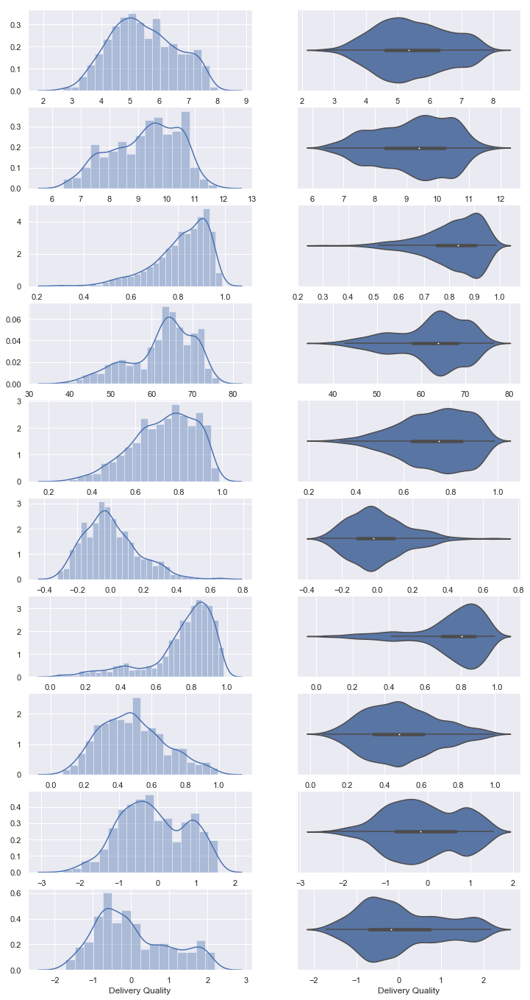

In [30]:
# Draw the distributions of all variables
f, axes = plt.subplots(10, 2, figsize=(12, 24))                             #diff colours?

count = 0
for var in numDF:
    sb.distplot(numDF[var], ax = axes[count,0])
    sb.violinplot(numDF[var], ax = axes[count,1])
    count += 1

# K-Means ++ Clustering and Visualisation (2017)

In [31]:
df2017 =  countryDFnew.loc[countryDFnew['year'].isin(['2017'])]
df2017.head()

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
9,Afghanistan,2017,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.261179,-1.917693,-1.432548
19,Albania,2017,4.639548,9.373718,0.637698,69.051659,0.749611,-0.035140,0.876135,0.457738,0.208456,-0.139161
25,Algeria,2017,5.248912,9.540244,0.806754,65.699188,0.436670,-0.194670,0.699774,0.486672,-1.008262,-0.814304
37,Argentina,2017,6.039330,9.843519,0.906699,67.538704,0.831966,-0.186300,0.841052,0.305430,0.381370,-0.238002
49,Armenia,2017,4.287736,9.034711,0.697925,65.125687,0.613697,-0.132166,0.864683,0.246901,-0.609075,-0.143278


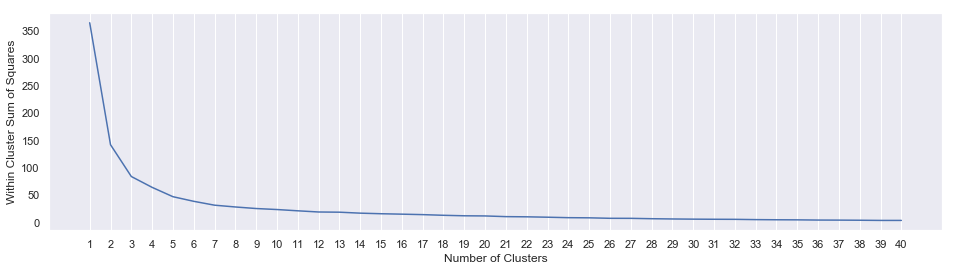

In [32]:
# Import KMeans from sklearn.cluster
from sklearn.cluster import KMeans

# Extract the Features from the Data
X = pd.DataFrame(df2017[["Log GDP per capita", "Life Ladder"]])

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Vary the Number of Clusters
min_clust = 1
max_clust = 40

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust,        # number of clusters
                    init = init_algo,              # initialization algorithm
                    n_init = 5)                    # number of initializations
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Plot Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

Features 	Total 	Speed

Cluster 0:	9.17	4.3	
Cluster 1:	10.74	6.43	
Cluster 2:	7.12	4.22	
Cluster 3:	10.21	6.05	
Cluster 4:	8.48	5.44	
Cluster 5:	9.63	5.23	
Cluster 6:	10.75	7.28	
Cluster 7:	9.08	6.21	
Cluster 8:	7.89	4.59	
Cluster 9:	7.35	3.3	

Within Cluster Sum of Squares : 22.48298466712711



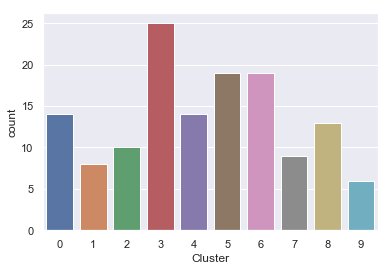

In [33]:
# Set "optimal" Number of Clusters
num_clust = 10

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

# Print the Cluster Centers
print("Features", "\tTotal", "\tSpeed")
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(X_labeled["Cluster"])

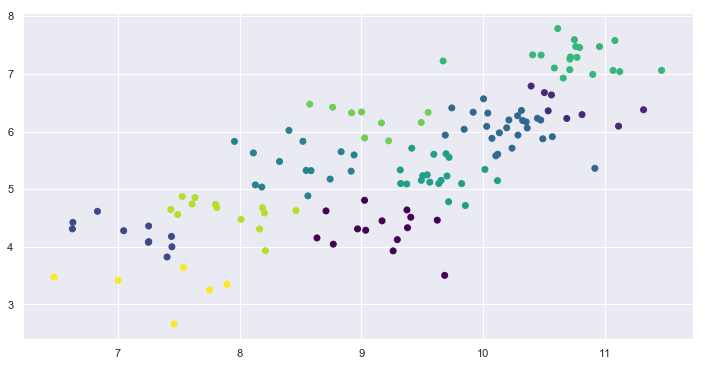

In [34]:
# Visualize the Clusters in the Data
f, axes = plt.subplots(1, 1, figsize=(12,6))
plt.scatter(x = "Log GDP per capita", y = "Life Ladder", c = "Cluster", cmap = 'viridis', data = X_labeled)

# Correlation and Most Important Variables

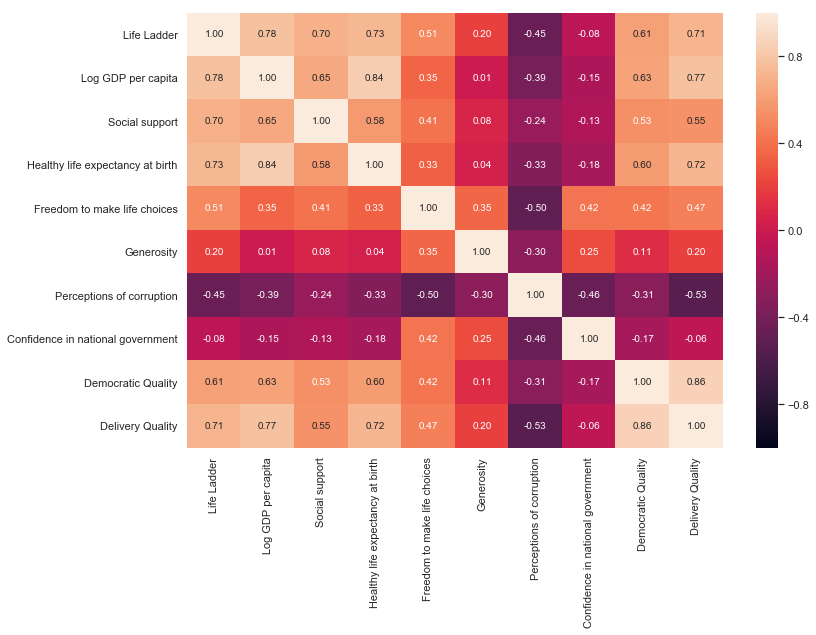

In [35]:
# Calculate the complete  correlation matrix
numDF.corr()

# Heatmap of the Correlation Matrix
f, axes = plt.subplots(1, 1, figsize=(12, 8))
sb.heatmap(numDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

## Highest correlation values are between Life Ladder and GDP, Healthy Life Expectancy at birth, Delivery Quality, Social Support

In [36]:
fig = tools.make_subplots(rows = 2, cols = 2, 
                          subplot_titles = ('Log GDP per capita Vs. Life Ladder', 
                                            'Healthy life expectancy Vs. Life Ladder',
                                            'Delivery Quality Vs. Life Ladder', 
                                            'Social Support Vs. Life Ladder'))

p1 = go.Scatter(
        x = numDF['Log GDP per capita'],
        y = numDF['Life Ladder'],
        mode = 'markers', showlegend = False)

fig.append_trace(p1,1, 1)


p2 = go.Scatter(
        x = numDF['Healthy life expectancy at birth'],
        y = numDF['Life Ladder'],
        mode = 'markers', showlegend = False)

fig.append_trace(p2, 1, 2)


p3 = go.Scatter(
        x = numDF['Social support'],
        y = numDF['Life Ladder'],
        mode = 'markers', showlegend = False)

fig.append_trace(p3, 2, 1)


p4 = go.Scatter(
        x = numDF['Delivery Quality'],
        y = numDF['Life Ladder'],
        mode = 'markers', showlegend = False)

fig.append_trace(p4, 2, 2)

fig['layout'].update(height = 1000, width = 1200)
py.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



## Linear Regression Models with these 4 variables to predict Life Ladder

### Life Ladder from Log GDP per capita

Intercept of Regression 	: b =  [-1.32194634]
Coefficients of Regression 	: a =  [[0.73211533]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6044473955478389
Mean Squared Error (MSE) 	: 0.4910753562410938
Root Mean Squared Error 	: 0.7007676906372708

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5974604033128432
Mean Squared Error (MSE) 	: 0.5152465295195062
Root Mean Squared Error 	: 0.717806749424597



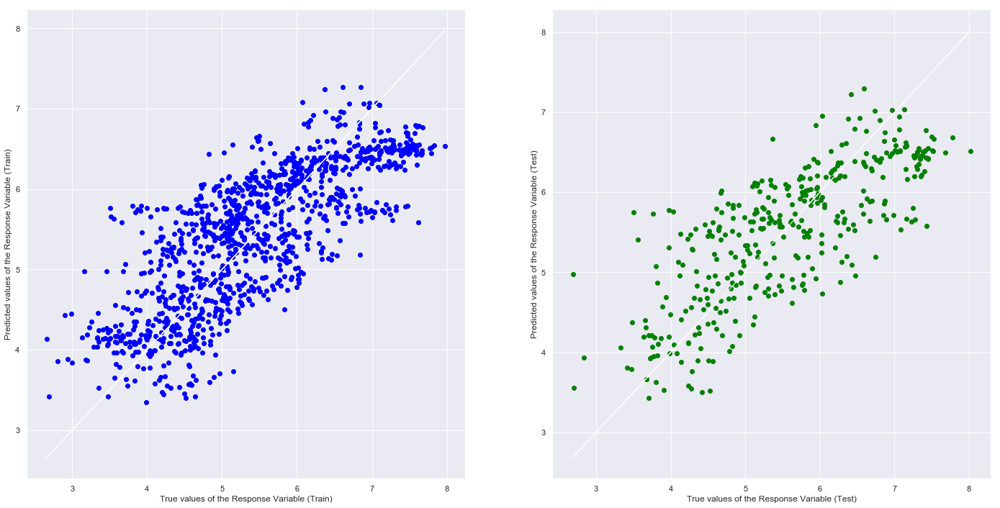

In [37]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

# Recall the Total-HP Dataset
LifeLadder = pd.DataFrame(numDF['Life Ladder'])   # Response
GDP = pd.DataFrame(numDF['Log GDP per capita'])         # Predictor

# Split the Dataset into Train and Test---- test = 0.25- fraction of data tp use as test
X_train, X_test, y_train, y_test = train_test_split(GDP, LifeLadder, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Life Ladder values corresponding to GDP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_train, y_train_pred)))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_test, y_test_pred)))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### Life Ladder from Healthy Life Expectancy at Birth

Intercept of Regression 	: b =  [-1.13685943]
Coefficients of Regression 	: a =  [[0.10543972]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5291425376304385
Mean Squared Error (MSE) 	: 0.6000903634767786
Root Mean Squared Error 	: 0.7746549964189081

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5373334147481252
Mean Squared Error (MSE) 	: 0.5516202408978201
Root Mean Squared Error 	: 0.7427114115844863



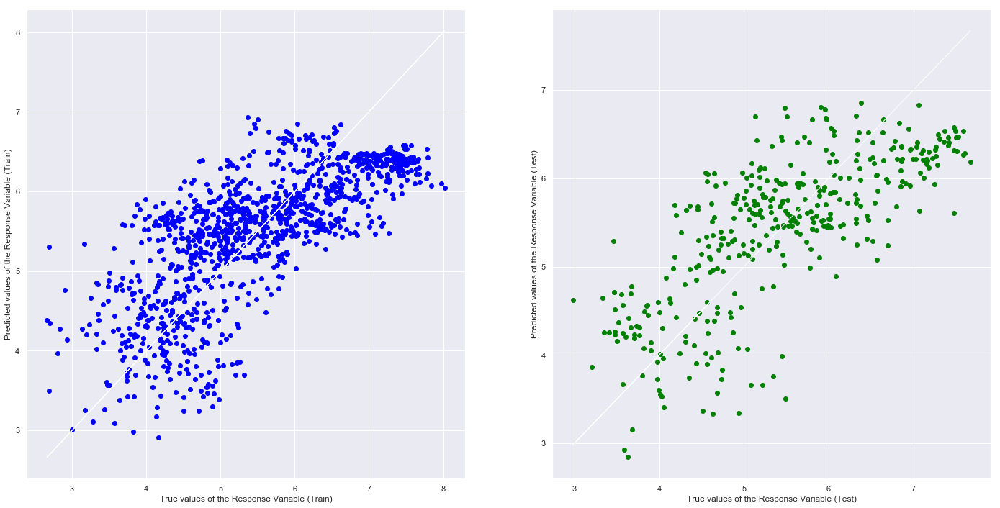

In [38]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

# Recall the Total-HP Dataset
LifeLadder = pd.DataFrame(numDF['Life Ladder'])   # Response
LifeExp = pd.DataFrame(numDF['Healthy life expectancy at birth'])         # Predictor

# Split the Dataset into Train and Test---- test = 0.25- fraction of data tp use as test
X_train, X_test, y_train, y_test = train_test_split(LifeExp, LifeLadder, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Life Ladder values corresponding to Life expectancy
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_train, y_train_pred)))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_test, y_test_pred)))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### Life Ladder from Social Security

Intercept of Regression 	: b =  [-1.08246024]
Coefficients of Regression 	: a =  [[0.10473574]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5395286908184538
Mean Squared Error (MSE) 	: 0.5850204524795719
Root Mean Squared Error 	: 0.7648662971262179

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.5040719955274613
Mean Squared Error (MSE) 	: 0.5966540526338039
Root Mean Squared Error 	: 0.7724338500051664



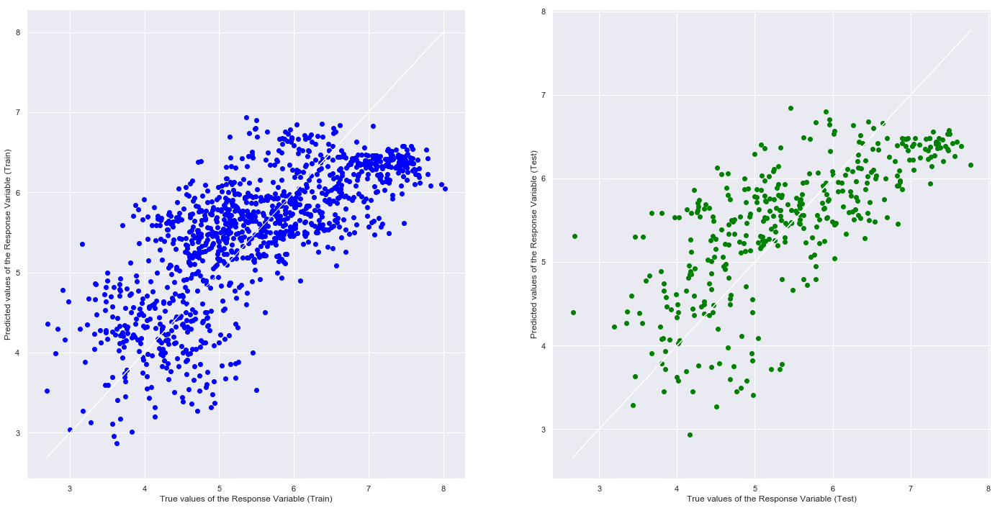

In [39]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

# Recall the Total-HP Dataset
LifeLadder = pd.DataFrame(numDF['Life Ladder'])   # Response
SocSup = pd.DataFrame(numDF['Social support'])         # Predictor

# Split the Dataset into Train and Test---- test = 0.25- fraction of data tp use as test
X_train, X_test, y_train, y_test = train_test_split(LifeExp, LifeLadder, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Life Ladder values corresponding to Social Support
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_train, y_train_pred)))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_test, y_test_pred)))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

### Life Ladder from Delivery Quality

Intercept of Regression 	: b =  [5.42336161]
Coefficients of Regression 	: a =  [[0.82488436]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.5097032340146922
Mean Squared Error (MSE) 	: 0.6177772636567749
Root Mean Squared Error 	: 0.785988081116231

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.4928814883254563
Mean Squared Error (MSE) 	: 0.6263266946622205
Root Mean Squared Error 	: 0.7914080456137784



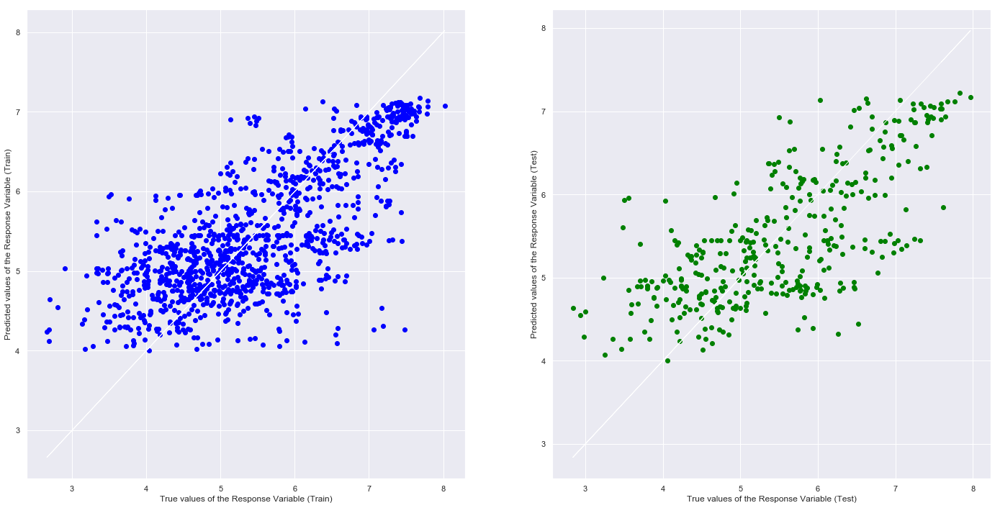

In [40]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

# Recall the Total-HP Dataset
LifeLadder = pd.DataFrame(numDF['Life Ladder'])   # Response
DelQual = pd.DataFrame(numDF['Delivery Quality'])         # Predictor

# Split the Dataset into Train and Test---- test = 0.25- fraction of data tp use as test
X_train, X_test, y_train, y_test = train_test_split(DelQual, LifeLadder, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Life Ladder values corresponding to GDP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_train, y_train_pred)))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print("Root Mean Squared Error \t:", sqrt(mean_squared_error(y_test, y_test_pred)))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

## Extrapolation of predictors for time series forecasting

In [41]:
for country in clist1[0:1]:
    countryDF2 = countryDFnew.loc[countryDFnew.country == country, :]
    countryDF2 = countryDF2.append({'country' : country , 'year' : 2020} , ignore_index=True)
    countryDF2 = countryDF2.set_index('year')
    df= countryDF2
    # Function to curve fit to the data
    def func(x, a, b, c, d):
        return a * (x ** 3) + b * (x ** 2) + c * x + d

    # Initial parameter guess, just to kick off the optimization
    guess = (0.5, 0.5, 0.5, 0.5)

    # Create copy of data to remove NaNs for curve fitting
    fit_df = df.dropna()

    # Place to store function parameters for each column
    col_params = {}
    # Curve fit each column
    for col in fit_df.columns:
        # Get x & y
        if(col=="country"):
            continue
        x = fit_df.index.astype(float).values
        y = fit_df[col].values
        # Curve fit column and get curve parameters
        params = curve_fit(func, x, y, guess)
        # Store optimized parameters
        col_params[col] = params[0]

    # Extrapolate each column
    for col in df.columns:
        if(col=="country"):
            continue
        # Get the index values for NaNs in the column
        x = df[pd.isnull(df[col])].index.astype(float).values
        # Extrapolate those points with the fitted function
        df[col][x] = func(x, *col_params[col])
    
    df.reset_index(level=0, inplace=True)
    temp=df.iloc[[-1]]

    

In [42]:
df

,year,country,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
0,2008,Afghanistan,3.723590,7.168690,0.450662,49.209663,0.718114,0.181819,0.881686,0.612072,-1.929690,-1.655084
1,2009,Afghanistan,4.401778,7.333790,0.552308,49.624432,0.678896,0.203614,0.850035,0.611545,-2.044093,-1.635025
2,2010,Afghanistan,4.758381,7.386629,0.539075,50.008961,0.600127,0.137630,0.706766,0.299357,-1.991810,-1.617176
3,2011,Afghanistan,3.831719,7.415019,0.521104,50.367298,0.495901,0.175329,0.731109,0.307386,-1.919018,-1.616221
4,2012,Afghanistan,3.782938,7.517126,0.520637,50.709263,0.530935,0.247159,0.775620,0.435440,-1.842996,-1.404078
5,2013,Afghanistan,3.572100,7.503376,0.483552,51.042980,0.577955,0.074735,0.823204,0.482847,-1.879709,-1.403036
6,2014,Afghanistan,3.130896,7.484583,0.525568,51.370525,0.508514,0.118579,0.871242,0.409048,-1.773257,-1.312503
7,2015,Afghanistan,3.982855,7.466215,0.528597,51.693527,0.388928,0.094686,0.880638,0.260557,-1.844364,-1.291594
8,2016,Afghanistan,4.220169,7.461401,0.559072,52.016529,0.522566,0.057072,0.793246,0.324990,-1.917693,-1.432548
9,2017,Afghanistan,2.661718,7.460144,0.490880,52.339527,0.427011,-0.106340,0.954393,0.261179,-1.917693,-1.432548


In [43]:
for country in clist1[1:]:
    countryDF2 = countryDFnew.loc[countryDFnew.country == country, :]
    countryDF2 = countryDF2.append({'country' : country , 'year' : 2020} , ignore_index=True)
    countryDF2 = countryDF2.set_index('year')
    df= countryDF2
    # Function to curve fit to the data
    def func(x, a, b):
        return a*x + b

    # Initial parameter guess, just to kick off the optimization
    guess = (0.5, 0.5)

    # Create copy of data to remove NaNs for curve fitting
    fit_df = df.dropna()

    # Place to store function parameters for each column
    col_params = {}
    # Curve fit each column
    for col in fit_df.columns:
        # Get x & y
        if(col=="country"):
            continue
        x = fit_df.index.astype(float).values
        y = fit_df[col].values
        # Curve fit column and get curve parameters
        params = curve_fit(func, x, y, guess)
        # Store optimized parameters
        col_params[col] = params[0]
    # Product of Taiwan
    # Extrapolate each column
    for col in df.columns:
        if(col=="country"):
            continue
        # Get the index values for NaNs in the column
        x = df[pd.isnull(df[col])].index.astype(float).values
        # Extrapolate those points with the fitted function
        df[col][x] = func(x, *col_params[col])
    
    df.reset_index(level=0, inplace=True)
    df3=df.iloc[[-1]]
    temp=temp.append(df3)

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:794: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:794: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:794: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:794: OptimizeWarning:

Covariance of the parameters could not be estimated

C:\Users\leady53\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:794: OptimizeWarning:

Covariance of the parameters could not be estimated



In [44]:
temp=temp.reset_index(drop=True)

In [45]:
temp
# Product of Taiwan

,year,country,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
0,2020,Afghanistan,2.248871,7.197793,0.481928,53.173126,0.492260,-0.282087,1.159383,0.182263,-2.084693,-1.633998
1,2020,Albania,4.433773,9.448303,0.554285,69.941718,0.834356,-0.036635,0.903684,0.529295,0.352465,-0.064148
2,2020,Algeria,5.492871,9.581917,0.769849,66.304986,0.403268,-0.178284,0.743250,0.486672,-0.907746,-0.846411
3,2020,Argentina,6.604685,9.899984,0.907091,67.964098,0.894536,-0.191709,0.823998,0.375786,0.338042,-0.420287
4,2020,Armenia,4.208884,9.112346,0.713352,65.657456,0.585416,-0.143257,0.927660,0.121273,-0.507047,-0.100599
5,2020,Australia,7.267301,10.743896,0.931457,73.205834,0.924758,0.257557,0.382042,0.407042,1.151288,1.753687
6,2020,Austria,7.184597,10.721801,0.913184,72.748590,0.884360,0.008863,0.581992,0.436908,1.140435,1.455387
7,2020,Azerbaijan,5.526956,9.845188,0.783488,64.017910,0.760512,-0.239749,0.568697,0.763555,-1.211430,-0.397449
8,2020,Bahrain,6.597071,10.749457,0.846360,66.491377,0.870024,0.154482,0.479363,0.486672,-1.531622,0.348276
9,2020,Bangladesh,4.506368,8.296676,0.664664,63.678315,0.949944,-0.088075,0.655024,0.856177,-0.797575,-0.683764


In [46]:
temp.shape

(146, 12)

In [47]:
#life ladder 0-10
col='Life Ladder'
for x in range(0, 146):
        
        if(temp[col][x] >10):
        
            temp[col][x] = 10
        
        
        elif(temp[col][x] <0):
        
            temp[col][x] = 0
        

# social support 0-1
col='Social support'
for x in range(0, 146):
        
        if(temp[col][x] >1):
        
            temp[col][x] = 1
        
        
        elif(temp[col][x] <0):
        
            temp[col][x] = 0
        


#freedom to make life choices 0-1
col='Freedom to make life choices'
for x in range(0, 146):
        
        if(temp[col][x] >1):
        
            temp[col][x] = 1
        
        
        elif(temp[col][x] <0):
        
            temp[col][x] = 0
        



#corruption 0-1
col='Perceptions of corruption'
for x in range(0, 146):
        
        if(temp[col][x] >1):
        
            temp[col][x] = 1
        
        
        elif(temp[col][x] <0):
        
            temp[col][x] = 0
        


#confidence 0-1
col='Confidence in national government'
for x in range(0, 146):
        
        if(temp[col][x] >1):
        
            temp[col][x] = 1
        
        
        elif(temp[col][x] <0):
        
            temp[col][x] = 0
        


In [48]:
temp

,year,country,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Confidence in national government,Democratic Quality,Delivery Quality
0,2020,Afghanistan,2.248871,7.197793,0.481928,53.173126,0.492260,-0.282087,1.000000,0.182263,-2.084693,-1.633998
1,2020,Albania,4.433773,9.448303,0.554285,69.941718,0.834356,-0.036635,0.903684,0.529295,0.352465,-0.064148
2,2020,Algeria,5.492871,9.581917,0.769849,66.304986,0.403268,-0.178284,0.743250,0.486672,-0.907746,-0.846411
3,2020,Argentina,6.604685,9.899984,0.907091,67.964098,0.894536,-0.191709,0.823998,0.375786,0.338042,-0.420287
4,2020,Armenia,4.208884,9.112346,0.713352,65.657456,0.585416,-0.143257,0.927660,0.121273,-0.507047,-0.100599
5,2020,Australia,7.267301,10.743896,0.931457,73.205834,0.924758,0.257557,0.382042,0.407042,1.151288,1.753687
6,2020,Austria,7.184597,10.721801,0.913184,72.748590,0.884360,0.008863,0.581992,0.436908,1.140435,1.455387
7,2020,Azerbaijan,5.526956,9.845188,0.783488,64.017910,0.760512,-0.239749,0.568697,0.763555,-1.211430,-0.397449
8,2020,Bahrain,6.597071,10.749457,0.846360,66.491377,0.870024,0.154482,0.479363,0.486672,-1.531622,0.348276
9,2020,Bangladesh,4.506368,8.296676,0.664664,63.678315,0.949944,-0.088075,0.655024,0.856177,-0.797575,-0.683764


In [49]:
linreg2020=temp

In [50]:
linreg2020 = pd.DataFrame(temp[["country", "year", "Life Ladder", "Log GDP per capita", "Social support", "Healthy life expectancy at birth", "Delivery Quality"]])

In [51]:
linreg2020

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Delivery Quality
0,Afghanistan,2020,2.248871,7.197793,0.481928,53.173126,-1.633998
1,Albania,2020,4.433773,9.448303,0.554285,69.941718,-0.064148
2,Algeria,2020,5.492871,9.581917,0.769849,66.304986,-0.846411
3,Argentina,2020,6.604685,9.899984,0.907091,67.964098,-0.420287
4,Armenia,2020,4.208884,9.112346,0.713352,65.657456,-0.100599
5,Australia,2020,7.267301,10.743896,0.931457,73.205834,1.753687
6,Austria,2020,7.184597,10.721801,0.913184,72.748590,1.455387
7,Azerbaijan,2020,5.526956,9.845188,0.783488,64.017910,-0.397449
8,Bahrain,2020,6.597071,10.749457,0.846360,66.491377,0.348276
9,Bangladesh,2020,4.506368,8.296676,0.664664,63.678315,-0.683764


Intercept of Regression 	: b =  [-0.86262277]
Coefficients of Regression 	: a =  [[0.24572677 3.00633702 0.02519731 0.24516343]]

                         Predictors  Coefficients
0                Log GDP per capita      0.245727
1                    Social support      3.006337
2  Healthy life expectancy at birth      0.025197
3                  Delivery Quality      0.245163



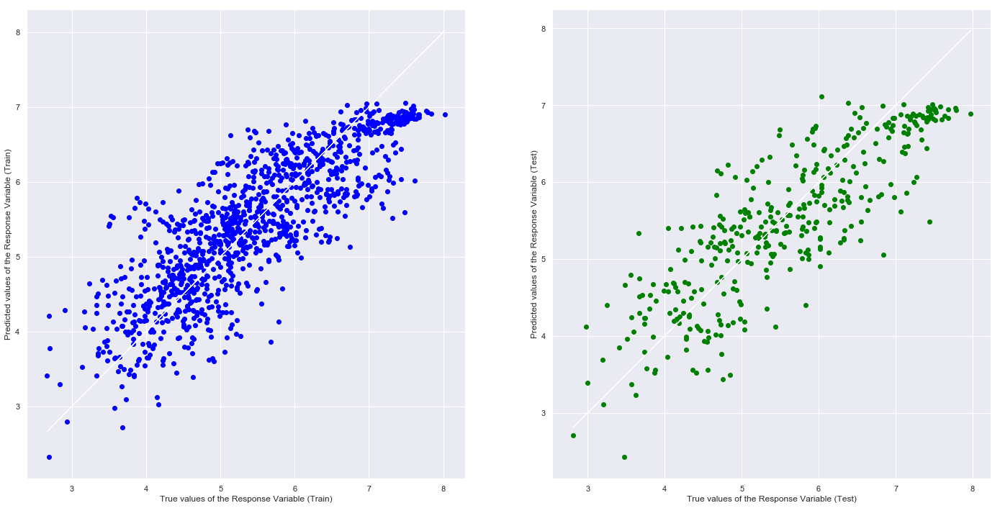

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.697614709177303
Mean Squared Error (MSE) 	: 0.37157708151000424

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7023343254602376
Mean Squared Error (MSE) 	: 0.39198529388625003



In [52]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Extract Response and Predictors
y = pd.DataFrame(countryDFnew["Life Ladder"])
X = pd.DataFrame(countryDFnew[["Log GDP per capita", "Social support", "Healthy life expectancy at birth",  "Delivery Quality"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

In [53]:
col='Life Ladder'
for x in range(0, 146):
    linreg2020[col][x]= (linreg.coef_[0][0]*linreg2020['Log GDP per capita'][x])+(linreg.coef_[0][1]*linreg2020['Social support'][x])+(linreg.coef_[0][2]*linreg2020['Healthy life expectancy at birth'][x])+(linreg.coef_[0][3]*linreg2020['Delivery Quality'][x])+linreg.intercept_[0]

In [54]:
linreg2020 

,country,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Delivery Quality
0,Afghanistan,2020,3.294130,7.197793,0.481928,53.173126,-1.633998
1,Albania,2020,4.872062,9.448303,0.554285,69.941718,-0.064148
2,Algeria,2020,5.269534,9.581917,0.769849,66.304986,-0.846411
3,Argentina,2020,5.906563,9.899984,0.907091,67.964098,-0.420287
4,Armenia,2020,5.150828,9.112346,0.713352,65.657456,-0.100599
5,Australia,2020,6.852245,10.743896,0.931457,73.205834,1.753687
6,Austria,2020,6.707226,10.721801,0.913184,72.748590,1.455387
7,Azerbaijan,2020,5.427671,9.845188,0.783488,64.017910,-0.397449
8,Bahrain,2020,6.084038,10.749457,0.846360,66.491377,0.348276
9,Bangladesh,2020,4.611184,8.296676,0.664664,63.678315,-0.683764


In [55]:
df=countryDFnew
df=df.sort_values(by=['year'])
year=2005
scl = [[0.0, '#ffffff'],[0.2, '#b4a8ce'],[0.4, '#8573a9'],
       [0.6, '#7159a3'],[0.8, '#5732a1'],[1.0, '#2c0579']]
data_slider = []

for year in df['year'].unique():
    df_segmented =  df[(df['year']== year)]

    for col in df_segmented.columns:
        df_segmented[col] = df_segmented[col].astype(str)

    data_each_yr = dict(
                        type='choropleth',
                        locations = df_segmented['country'],
                        z=df_segmented['Life Ladder'].astype(float),
                        zmin=2,
                        zmax=8,
                        locationmode='country names',
                        colorscale = scl,
                        colorbar= {'title':'Happiness'})

    data_slider.append(data_each_yr)

steps = []
for i in range(len(data_slider)):
    step = dict(method='restyle',
                args=['visible', [False] * len(data_slider)],
                label='Year {}'.format(i + 2005))
    step['args'][1][i] = True
    steps.append(step)

sliders = [dict(active=0, pad={"t": 1}, steps=steps)]

layout = dict(title ='Happiness of Countries starting 2005', geo=dict(scope='world',
                       projection={'type': 'mercator'}),
              sliders=sliders)

fig = dict(data=data_slider, layout=layout)
py.iplot(fig, filename = 'd3-cloropleth-map')

In [56]:
df = linreg2020 

#df['text'] = df['country'] #+ '' + 'Happiness: ' + df['Life Ladder'].astype(str)

scl = [
    [0.0, 'rgb(255,221,255)'],
    [0.2, 'rgb(255,191,255)'],
    [0.4, 'rgb(255,165,255)'],
    [0.6, 'rgb(255,100,255)'],
    [0.8, 'rgb(255,60,255)'],
    [1.0, 'rgb(255,0,153)']
]


data = [go.Choropleth(
    colorscale = scl,
    autocolorscale = False,
    locations = df['country'],
    z = df['Life Ladder'].astype(float),
    locationmode = 'country names',
    #text = df['text'],
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(0,0,0)',
            width = 1
        )),
    colorbar = go.choropleth.ColorBar(
        title = "Happiness in 2020")
)]

layout = dict(title ='Predicted Happiness of Countries in 2020', geo=dict(scope='world',
                       projection={'type': 'mercator'}))

fig = dict(data=data, layout=layout)
py.iplot(fig, filename = 'd3-cloropleth-map')